# Processamento dei dati

Per prima cosa è necessario scaricare un geodatabase (qui usiamo un file .shp) con le coordinate di presenza/assenza, che può essere caricato direttamente in Python come GeoPandas GeoDataFrame (una struttura di dati tabellari per tipi di dati geometrici). In questo caso, la colonna CLASSE è un'indicazione binaria della presenza/assenza della specie. Per questa esercitazione, utilizzeremo gli alberi di Joshua (Yucca brevifolia) come specie di esempio

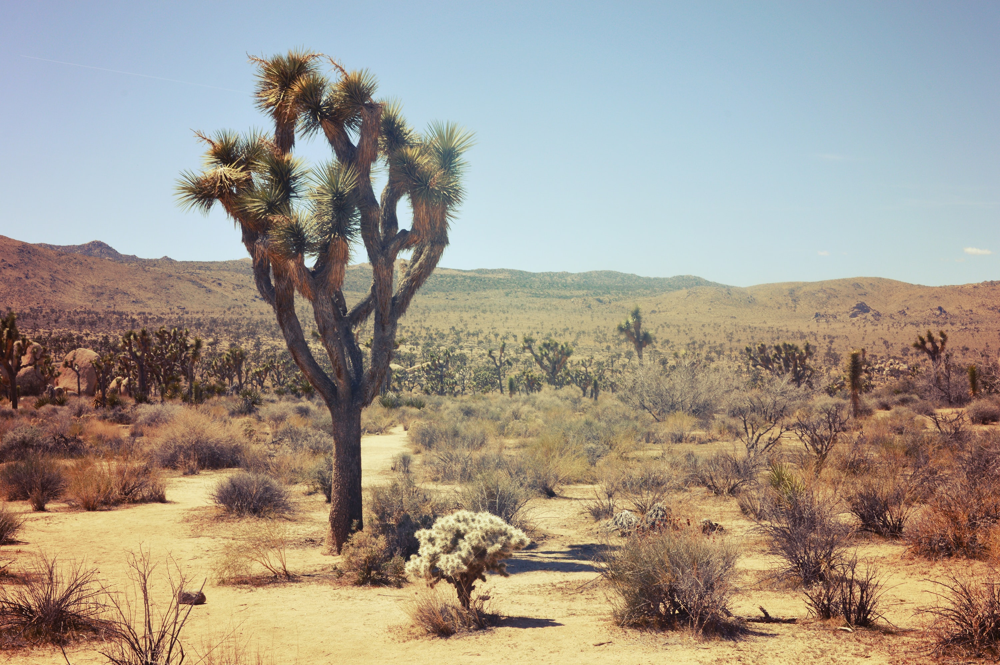

In [74]:
import geopandas as gpd


# Read in the data
pa = gpd.read_file("/kaggle/input/jtree-sdm/jtree.shp")
pa.sample(5)

,CLASS,lon,lat,geometry
580,1.0,-115.842414,33.848251,POINT (-115.84241 33.84825)
2190,1.0,-116.042925,34.009183,POINT (-116.04292 34.00918)
3497,1.0,-114.104880,34.844253,POINT (-114.10488 34.84425)
2474,1.0,-115.502267,36.450520,POINT (-115.50227 36.45052)
2754,1.0,-118.001152,37.188457,POINT (-118.00115 37.18846)


Facciamo un controllo delle classi, per assicurarci che non ci siano eccessivi sbilanciamenti

In [3]:
pa.CLASS.value_counts()

1.0    3884
0.0    3316
Name: CLASS, dtype: int64

Ora controlliamo che non ci siano coordinate duplicate o NaN e ispezioniamo gli attributi dello shapefile

In [4]:
print("number of duplicates: ", pa.duplicated(subset='geometry', keep='first').sum())
print("number of NA's: ", pa['geometry'].isna().sum())
print("Coordinate reference system is: {}".format(pa.crs))
print("{} observations with {} columns".format(*pa.shape))

number of duplicates:  0
number of NA's:  0
Coordinate reference system is: GEOGCS["GCS_unknown",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433],AXIS["Longitude",EAST],AXIS["Latitude",NORTH]]
7200 observations with 4 columns


Possiamo mappare le presenze delle specie (pa==1)

<AxesSubplot:>

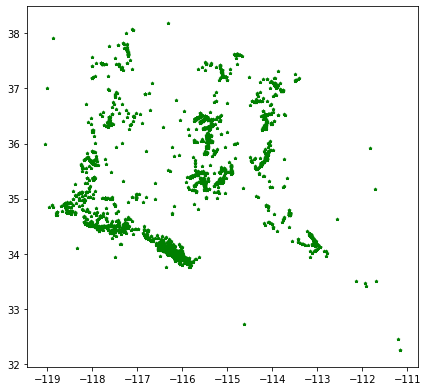

In [5]:
pa[pa.CLASS == 1].plot(marker='*', color='green', markersize=8, figsize= (7,7))

Possiamo mappare le assenze delle specie (pa==1)

<AxesSubplot:>

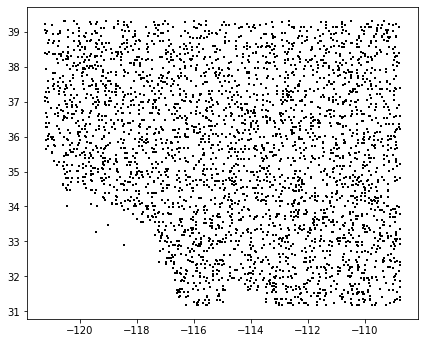

In [6]:
pa[pa.CLASS == 0].plot(marker='+', color='black', markersize=8, figsize= (7,7))

Tuttavia, se non si dispone di un database geospaziale con coordinate di presenza/assenza, esistono alcuni semplici passaggi per crearne uno per qualsiasi specie di interesse! Si può iniziare cercando tra i dati aperti del Global Biodiversity Information Facility (GBIF), scaricando un database di specie in .csv e migrando in R per eseguire il pipe del database in .shp

# Mappatura dell'idoneità delle specie

In questa sezione addestreremo i nostri classificatori di apprendimento automatico e faremo previsioni spaziali sulla distribuzione delle specie nelle condizioni attuali (1970-2000).

Per prima cosa, carichiamo 19 caratteristiche bioclimatiche (qui usiamo una risoluzione di 2,5 minuti d'arco) dal database pubblico WorldClim (v. 2.1, Fick & Hijmans, 2017). Le variabili bioclimatiche sono derivate dai valori mensili di temperatura e precipitazioni per generare variabili biologicamente più significative. Sono spesso utilizzate nella modellazione della distribuzione delle specie e nelle relative tecniche di modellazione ecologica

In [19]:
import glob
# grab climate features - cropped to joshua tree study area
raster_features = sorted(glob.glob(
    '/kaggle/input/bioclimatic-variables/wc2.1_2.5m_bio_*.tif'))
# check number of features 
print('\nThere are', len(raster_features), 'raster features.')


There are 19 raster features.


Selezioniamo solo 9 variabili tra le 19 per diminuire il peso nel calcolo

In [20]:
# select 9 climate features
raster_features = raster_features[1:11]

Installiamo una libreria richiesta

In [8]:
pip install pyimpute

  Preparing metadata (setup.py) ... done
  Created wheel for pyimpute: filename=pyimpute-0.3-py3-none-any.whl size=6044 sha256=943036729d5fe5bda974c2f45e34cc0c5c2b87f1a9dfe13fe15a11619f97b71e
  Stored in directory: /root/.cache/pip/wheels/cd/7a/bc/e4e769aa6d7ecdb00cc5579f9d3ace47ac430c99f4665387c5
Successfully built pyimpute
Note: you may need to restart the kernel to use updated packages.


Siamo ora pronti a utilizzare pyimpute per generare le mappe raster di idoneità. Per prima cosa prepariamo il flusso di lavoro di pyimpute:

In [21]:
from pyimpute import load_training_vector
from pyimpute import load_targets
train_xs, train_y = load_training_vector(pa, raster_features, response_field='CLASS')
target_xs, raster_info = load_targets(raster_features)
train_xs.shape, train_y.shape # check shape, does it match the size above of the observations?

((7200, 9), (7200,))

Rinominiamo le colonne del nostro dataset con quelle corrispostenti alle variabili climatiche

In [25]:
import pandas as pd
train_xs = pd.DataFrame(train_xs)
train_xs.columns =["bio11", "bio12", "bio13", "bio14", "bio15", "bio16", "bio17", "bio18", "bio19"]

Facciamo un controllo dei valori mancanti (NA) perchè alcuni algoritmi non digeriscono le celle vuote, e riempiamo tali valori mancanti con i valori medi delle colonne

In [26]:
print("number of NA's: ", train_xs.isna().sum())

number of NA's:  bio11    2
bio12    2
bio13    2
bio14    2
bio15    2
bio16    2
bio17    2
bio18    2
bio19    2
dtype: int64


In [27]:
from sklearn.impute import SimpleImputer
# Imputation (mean is default, but you can set: strategy='median')
my_imputer = SimpleImputer()
imputed_train_xs = pd.DataFrame(my_imputer.fit_transform(train_xs))
# Imputation removed column names; put them back
imputed_train_xs.columns = train_xs.columns

In [28]:
print("number of NA's: ", imputed_train_xs.isna().sum())

number of NA's:  bio11    0
bio12    0
bio13    0
bio14    0
bio15    0
bio16    0
bio17    0
bio18    0
bio19    0
dtype: int64


Creiamo la cartella dei risultati (outputs)

In [76]:
imputed_train_xs

,bio11,bio12,bio13,bio14,bio15,bio16,bio17,bio18,bio19
0,8.497334,324.0,51.0,2.0,60.475082,145.0,25.0,57.0,145.0
1,7.721334,306.0,49.0,2.0,61.154942,139.0,23.0,35.0,139.0
2,9.698000,333.0,52.0,4.0,48.358517,117.0,24.0,89.0,102.0
3,7.401333,359.0,58.0,2.0,63.374893,165.0,26.0,57.0,165.0
4,9.303333,113.0,16.0,2.0,41.434635,43.0,13.0,27.0,37.0
...,...,...,...,...,...,...,...,...,...
7195,11.390000,245.0,44.0,3.0,57.271671,104.0,14.0,81.0,68.0
7196,12.160000,133.0,21.0,1.0,49.461483,46.0,8.0,34.0,46.0
7197,13.781334,70.0,12.0,1.0,57.473721,32.0,4.0,17.0,32.0
7198,0.164667,258.0,37.0,7.0,37.688545,94.0,33.0,75.0,60.0


In [29]:
import os 
#os.mkdir("inputs")
os.mkdir("outputs")

Implementazione di diversi classificatori scikit-learn:

In [30]:
# import machine learning classifiers
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier


CLASS_MAP = {
    'rf': (RandomForestClassifier()),
    'et': (ExtraTreesClassifier()),
    'xgb': (XGBClassifier()),
    'lgbm': (LGBMClassifier())
    }

from pyimpute import impute
from sklearn import model_selection

# model fitting and spatial range prediction
for name, (model) in CLASS_MAP.items():
    # cross validation for accuracy scores (displayed as a percentage)
    k = 5 # k-fold
    kf = model_selection.KFold(n_splits=k)
    accuracy_scores = model_selection.cross_val_score(model, imputed_train_xs, train_y, cv=kf, scoring='accuracy')
    print(name + " %d-fold Cross Validation Accuracy: %0.2f (+/- %0.2f)"
          % (k, accuracy_scores.mean() * 100, accuracy_scores.std() * 200))
    
    # spatial prediction
    model.fit(imputed_train_xs, train_y)
    #os.mkdir('outputs/' + name + '-images')
    impute(target_xs, model, raster_info, outdir='outputs/' + name + '-images',
           class_prob=True, certainty=True)

rf 5-fold Cross Validation Accuracy: 89.38 (+/- 6.06)


/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  "X does not have valid feature names, but"
/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  "X does not have valid feature names, but"
/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  "X does not have valid feature names, but"
/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  "X does not have valid feature names, but"
/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with

et 5-fold Cross Validation Accuracy: 89.01 (+/- 8.30)


/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but ExtraTreesClassifier was fitted with feature names
  "X does not have valid feature names, but"
/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but ExtraTreesClassifier was fitted with feature names
  "X does not have valid feature names, but"
/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but ExtraTreesClassifier was fitted with feature names
  "X does not have valid feature names, but"
/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but ExtraTreesClassifier was fitted with feature names
  "X does not have valid feature names, but"
/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but ExtraTreesClassifier was fitted with feature n

xgb 5-fold Cross Validation Accuracy: 89.65 (+/- 6.86)
lgbm 5-fold Cross Validation Accuracy: 90.21 (+/- 7.03)


Abbiamo un raster risposte.tif che rappresenta la classe prevista (0 o 1) e probabilità_1.tif con una scala di idoneità continua. Facciamo la media dei risultati continui per i quattro modelli e tracciamo la nostra mappa.

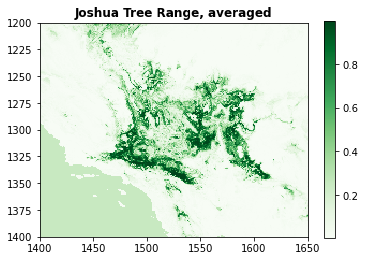

In [69]:
from pylab import plt
# define spatial plotter
def plotit(x, title, cmap="Blues"):
    plt.xlim([1400, 1650])
    plt.ylim([1400,1200])
    #plt.figure(figsize=(12, 6))
    plt.imshow(x, cmap=cmap, interpolation='nearest')
    plt.colorbar()
    plt.title(title, fontweight = 'bold')

import rasterio
distr_rf = rasterio.open("outputs/rf-images/probability_1.0.tif").read(1)
distr_et = rasterio.open("outputs/et-images/probability_1.0.tif").read(1)
distr_xgb =  rasterio.open("outputs/xgb-images/probability_1.0.tif").read(1)
distr_lgbm =  rasterio.open("outputs/lgbm-images/probability_1.0.tif").read(1)
distr_averaged = (distr_rf + distr_et + distr_xgb + distr_lgbm)/4  

plotit(distr_averaged, "Joshua Tree Range, averaged", cmap="Greens")

# Possibili estensioni del modello

1) Determinare quali variabili predittive hanno avuto un maggior peso nelle prestazioni del modello

2) Valutare gli effetti di diversi valori delle variabili predittive sulla variabile di risposta; ad esempio: alti (o bassi) valori della pioggia che impatto hanno sulla presenza di una specie?

3) Estendere il dataset; ad esempio: 1) variabili geofisiche, 2) impatto antropico, 3) stato delle specie (vitalità/malattie), ecc....